# **Load Data**

In [ ]:
# Chọn tệp JSON API Token từ máy tính
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"khnhtrnan","key":"c5beedcc7ade2bd6299fecf6973b08dc"}'}

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [ ]:
!kaggle datasets download -d "splcher/animefacedataset"

Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset
License(s): DbCL-1.0
100% 393M/395M [00:20<00:00, 24.3MB/s]
100% 395M/395M [00:20<00:00, 20.4MB/s]


In [ ]:
import zipfile
import os

# Đường dẫn đến file ZIP
zip_path = '/content/animefacedataset.zip'

# Đường dẫn mà bạn muốn giải nén file ZIP vào
extract_to = '/content/data'

# Kiểm tra và tạo thư mục nếu thư mục đích không tồn tại
if not os.path.exists(extract_to):
    os.makedirs(extract_to)

# Giải nén file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'Đã giải nén file thành công vào {extract_to}')

Đã giải nén file thành công vào /content/data


# **Import library**

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
from PIL import Image
import warnings
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Dense, Flatten, Conv2DTranspose,
    Reshape, BatchNormalization, Dropout, Input, ReLU, LeakyReLU
)
# Set plot style
sns.set(style="darkgrid", color_codes=True)

# Ignore warnings
warnings.filterwarnings('ignore')


# **Prepare Data**

In [ ]:
DIR_IMAGES = '/content/data/images'

In [ ]:
image_path = []

for path in os.listdir(DIR_IMAGES):
  image_path.append(os.path.join(DIR_IMAGES, path))

In [ ]:
len(image_path)

63565

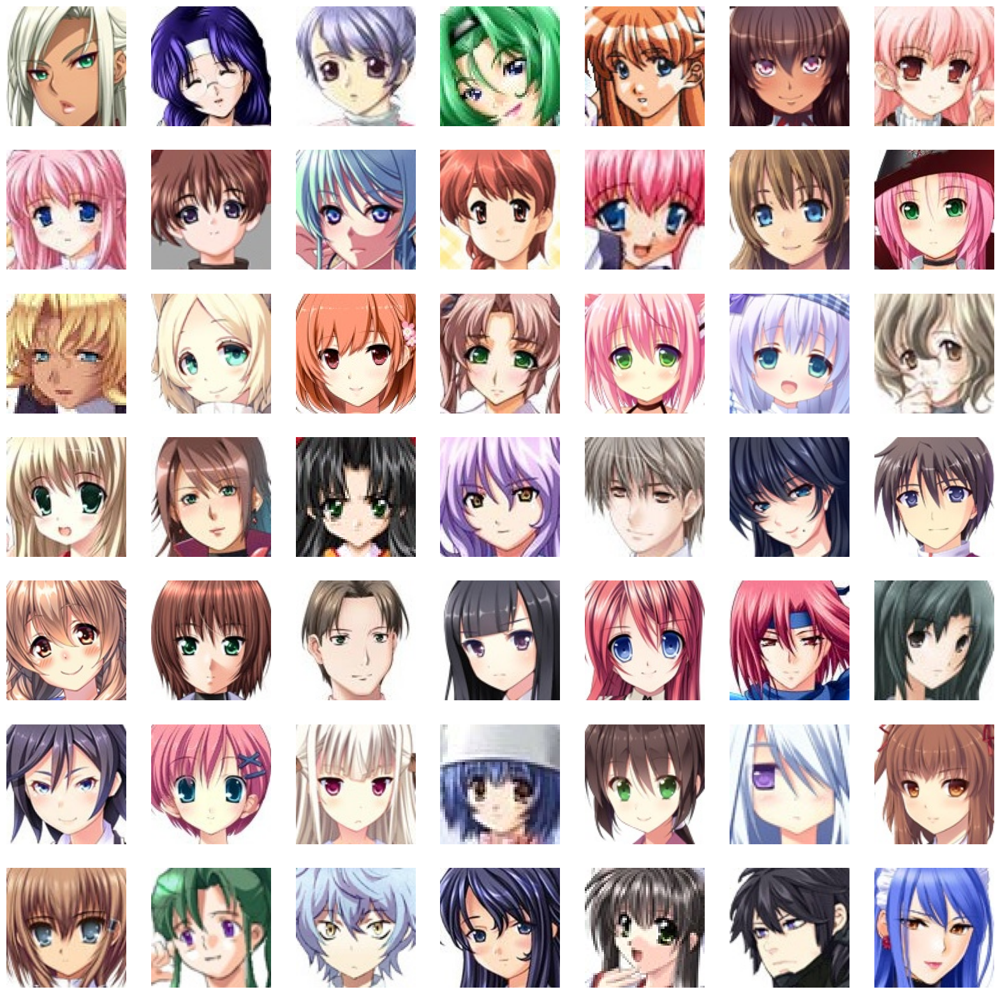

In [ ]:
plt.figure(figsize=(20, 20))
temp_image = image_path[:49]
for i in range(49):
  plt.subplot(7, 7, i+1)
  plt.imshow(load_img(temp_image[i]))
  plt.axis('off')


100%|██████████| 63565/63565 [00:22<00:00, 2863.15it/s]


Loaded 63565 images with shape: (63565, 64, 64, 1)


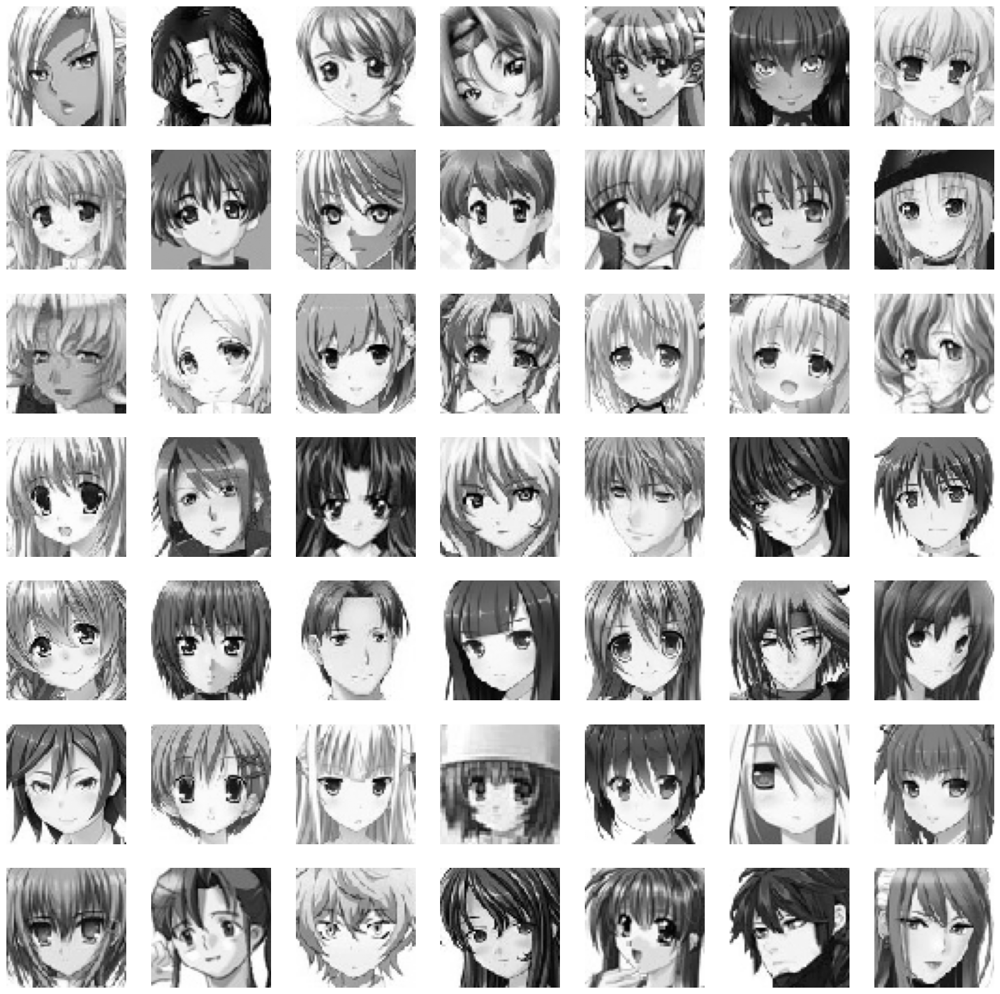

In [ ]:
from tqdm import tqdm
from PIL import UnidentifiedImageError
from keras.utils import load_img, img_to_array  # Ensure correct imports
import numpy as np
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Set fixed image size (e.g., 64x64)
TARGET_SIZE = (64, 64)

# Initialize the list to hold image arrays
train_images = []

# Process images
for path in tqdm(image_path):
    try:
        # Load image and resize to target size
        img = load_img(path, target_size=TARGET_SIZE, color_mode="grayscale")  # Load as grayscale
        img_array = img_to_array(img)  # Convert to NumPy array
        train_images.append(img_array)  # Append to the list
    except UnidentifiedImageError:
        print(f"Skipping corrupted or invalid image: {path}")
    except FileNotFoundError:
        print(f"File not found: {path}")
    except Exception as e:  # Catch other unexpected errors
        print(f"An error occurred while processing {path}: {e}")

# Convert the list of images to a NumPy array
train_images = np.array(train_images)  # Ensure all images have the same size
print(f"Loaded {len(train_images)} images with shape: {train_images.shape}")

# Plot the first 49 images (if available)
plt.figure(figsize=(20, 20))
num_images_to_plot = min(49, len(train_images))  # Ensure we don't plot more than available
for i in range(num_images_to_plot):
    plt.subplot(7, 7, i + 1)
    plt.imshow(train_images[i].squeeze(), cmap="gray")  # Display in grayscale
    plt.axis("off")
plt.show()



In [ ]:
train_images[0].min(), train_images[0].max()

(6.0, 255.0)

In [ ]:
train_images = train_images /255

In [ ]:
train_images[1].min(), train_images[1].max()

(0.003921569, 1.0)

In [ ]:
train_images[0].shape

(64, 64, 1)

# **Train Model**

In [ ]:
# latent dimension for random noise
LATENT_DIM = 100
# no. of channels of the image
CHANNELS = 1

In [ ]:
from tensorflow.keras import layers, Sequential
import tensorflow as tf

def build_generator():
    model = Sequential(name='generator')

    # 1D random noise -> Fully Connected Layer
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM, kernel_initializer='he_normal'))
    model.add(layers.ReLU())
    model.add(layers.Reshape((8, 8, 512)))

    # Upsample to 16x16
    model.add(layers.Conv2DTranspose(
        256, (3, 3), strides=(2, 2), padding='same', kernel_initializer='he_normal'
    ))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsample to 32x32
    model.add(layers.Conv2DTranspose(
        128, (3, 3), strides=(2, 2), padding='same', kernel_initializer='he_normal'
    ))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsample to 64x64
    model.add(layers.Conv2DTranspose(
        64, (3, 3), strides=(2, 2), padding='same', kernel_initializer='he_normal'
    ))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Final layer to get 64x64x3 output
    model.add(layers.Conv2D(
        CHANNELS, (3, 3), padding='same', activation='tanh', kernel_initializer='he_normal'
    ))

    model.summary()
    return model


In [ ]:
generator = build_generator()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                      │ (None, 32768)               │       3,309,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 16, 16, 256)         │       1,179,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_4 (Conv2DTranspose) │ (None, 32, 32, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_5 (Conv2DTranspose) │ (None, 64, 64, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 1)           │             577 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,860,673 (18.54 MB)

 Trainable params: 4,859,777 (18.54 MB)

 Non-trainable params: 896 (3.50 KB)

In [ ]:
noise = tf.random.normal([1, 100])
noise

<tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[ 7.74930835e-01, -1.19146265e-01, -4.56611127e-01,
         5.01208007e-01, -1.32442760e+00, -6.95368111e-01,
         7.59376109e-01,  4.58324254e-01,  2.71325886e-01,
        -8.91261771e-02,  1.64893818e+00, -5.31343162e-01,
        -4.51059371e-01,  2.03516737e-01,  1.63723186e-01,
         3.92433047e-01, -2.49679431e-01, -2.37911010e+00,
        -7.17095882e-02, -1.16332889e+00, -7.51271307e-01,
         2.40287280e+00,  5.26278496e-01,  4.70430553e-01,
        -5.99623024e-01, -4.00292903e-01,  7.95609891e-01,
         1.98287463e+00, -1.45423186e+00, -2.79883355e-01,
         1.52457857e+00, -2.44349194e+00, -2.00446203e-01,
         3.36591423e-01, -2.44841862e+00,  1.51392150e+00,
        -6.94667816e-01,  1.00132501e+00,  1.49631247e-01,
         4.06816632e-01,  1.60510397e+00,  7.50218928e-01,
         4.31515783e-01, -2.03535509e+00, -5.45561194e-01,
         2.10350442e+00, -4.75029014e-02,  6.09538972e-01,
      

In [ ]:
generated_image = generator(noise, training = False)

In [ ]:
generated_image.shape

TensorShape([1, 64, 64, 1])

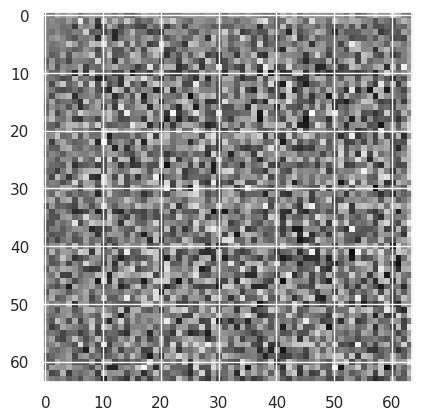

In [ ]:
plt.imshow(generated_image[0, :,:,0], cmap='gray');

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

def build_discriminator():
    model = tf.keras.Sequential(name='discriminator')

    # Input layer: 64x64x1
    model.add(layers.Conv2D(filters=64, kernel_size=(5, 5), strides=(2, 2), padding='same', input_shape=(64, 64, 1)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.2))  # Dropout giảm nhẹ

    # 32x32x64 -> 32x32x128
    model.add(layers.Conv2D(filters=128, kernel_size=(5, 5), strides=(2, 2), padding='same', kernel_regularizer=tf.keras.regularizers.L2(1e-4)))
    model.add(layers.BatchNormalization())  # Thêm BatchNorm
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # 16x16x128 -> 16x16x256
    model.add(layers.Conv2D(filters=256, kernel_size=(5, 5), strides=(2, 2), padding='same', kernel_regularizer=tf.keras.regularizers.L2(1e-4)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # 8x8x256 -> 8x8x512
    model.add(layers.Conv2D(filters=512, kernel_size=(5, 5), strides=(2, 2), padding='same', kernel_regularizer=tf.keras.regularizers.L2(1e-4)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten
    model.add(layers.Flatten())

    # Dense output layer
    model.add(layers.Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

    model.summary()

    return model


In [ ]:
discriminator = build_discriminator()

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 64)          │           1,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_6 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 128)         │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_7 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 8, 8, 256)           │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_8 (LeakyReLU)            │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 4, 4, 512)           │       3,277,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 4, 4, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_9 (LeakyReLU)            │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,315,137 (16.46 MB)

 Trainable params: 4,313,345 (16.45 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [ ]:
discriminator(generated_image, training = False) # logits

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.49832088]], dtype=float32)>

In [ ]:
tf.sigmoid(-0.00081761)

<tf.Tensor: shape=(), dtype=float32, numpy=0.4997956454753876>

In [ ]:
import tensorflow as tf
from tensorflow import keras

class DCGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]

    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn

    def train_step(self, real_images):
        # Batch size
        batch_size = tf.shape(real_images)[0]

        # Random noise
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # ===== Train Discriminator =====
        with tf.GradientTape() as tape:
            # Real images loss
            pred_real = self.discriminator(real_images, training=True)
            real_labels = tf.ones((batch_size, 1))
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))  # Label smoothing
            d_loss_real = self.loss_fn(real_labels, pred_real)

            # Fake images loss
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            fake_labels = tf.zeros((batch_size, 1))
            fake_labels += 0.05 * tf.random.uniform(tf.shape(fake_labels))  # Fake label smoothing
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)

            # Total loss
            d_loss = (d_loss_real + d_loss_fake) / 2

        # Compute and clip gradients for discriminator
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        gradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in gradients]
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))

        # ===== Train Generator =====
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_noise, training=True)
            pred_fake = self.discriminator(fake_images, training=True)
            g_loss = self.loss_fn(tf.ones((batch_size, 1)), pred_fake)  # Generator tries to fool discriminator

        # Compute and clip gradients for generator
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        gradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in gradients]
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}


In [ ]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=25, latent_dim=100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        # create random noise for generating images
        self.noise = tf.random.normal([25, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        # generate the image from noise
        g_img = self.model.generator(self.noise)
        g_img.numpy()

        fig = plt.figure(figsize=(8, 8))
        for i in range(self.num_imgs):
            plt.subplot(5, 5, i+1)
            img = array_to_img(g_img[i])
            plt.imshow(img)
            plt.axis('off')
        # plt.savefig('epoch_{:03d}.png'.format(epoch))
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [ ]:
dcgan = DCGAN(generator=generator, discriminator=discriminator, latent_dim=LATENT_DIM)

In [ ]:
D_LR = 0.00001
G_LR = 0.00003
dcgan.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())

In [ ]:
N_EPOCHS = 100
dcgan.fit(train_images, epochs=N_EPOCHS, callbacks=[DCGANMonitor()])

In [ ]:
dcgan.on_train_end()

NameError: name 'dcgan' is not defined

In [ ]:
import tensorflow as tf
from tensorflow import keras

class WGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]

    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(WGAN, self).compile()  # Fixing the call to super
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn

    def train_step(self, real_images):
        # Batch size
        batch_size = tf.shape(real_images)[0]

        # Random noise
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # ===== Train Discriminator (Critic) =====
        with tf.GradientTape() as tape:
            # Real images loss
            pred_real = self.discriminator(real_images, training=True)
            real_labels = tf.ones((batch_size, 1))
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))  # Label smoothing
            d_loss_real = self.loss_fn(real_labels, pred_real)

            # Fake images loss
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            fake_labels = tf.zeros((batch_size, 1))
            fake_labels += 0.05 * tf.random.uniform(tf.shape(fake_labels))  # Fake label smoothing
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)

            # Total loss
            d_loss = (d_loss_real + d_loss_fake) / 2

        # Compute and clip gradients for discriminator (Critic)
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        gradients = [tf.clip_by_value(grad, -0.01, 0.01) for grad in gradients]  # Clipping gradients for Critic
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))

        # ===== Train Generator =====
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_noise, training=True)
            pred_fake = self.discriminator(fake_images, training=True)
            g_loss = self.loss_fn(tf.ones((batch_size, 1)), pred_fake)  # Generator tries to fool discriminator

        # Compute gradients for generator
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}


In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import array_to_img

class WGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=25, latent_dim=100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        # Create random noise for generating images
        self.noise = tf.random.normal([self.num_imgs, self.latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        # Generate the image from noise using the generator
        g_img = self.model.generator(self.noise, training=False)  # Ensure no training behavior during inference
        g_img.numpy()  # Convert tensor to numpy (if necessary)

        fig = plt.figure(figsize=(8, 8))
        for i in range(self.num_imgs):
            plt.subplot(5, 5, i+1)
            img = array_to_img(g_img[i])  # Convert tensor to image
            plt.imshow(img)
            plt.axis('off')
        # Save the generated image at the end of each epoch (optional)
        plt.savefig(f'generated_image_epoch_{epoch:03d}.png')
        plt.show()

    def on_train_end(self, logs=None):
        # Save the generator model after training ends
        self.model.generator.save('generator_wgan.h5')



In [ ]:
wgan = WGAN(generator=generator, discriminator=discriminator, latent_dim=LATENT_DIM)

In [ ]:
D_LR = 0.00001
G_LR = 0.00003
wgan.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())

Epoch 1/100
1987/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - d_loss: -0.3406 - g_loss: 1.5143

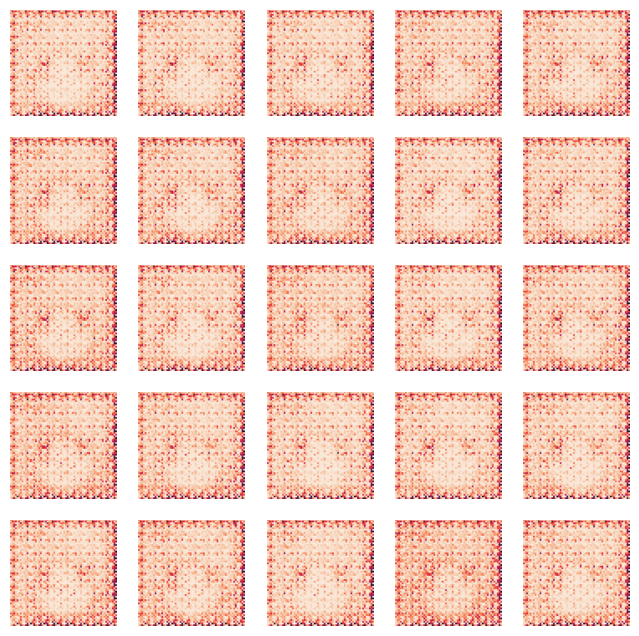

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 217s 93ms/step - d_loss: -0.3407 - g_loss: 1.5154
Epoch 2/100
1987/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.0687 - g_loss: 0.7271

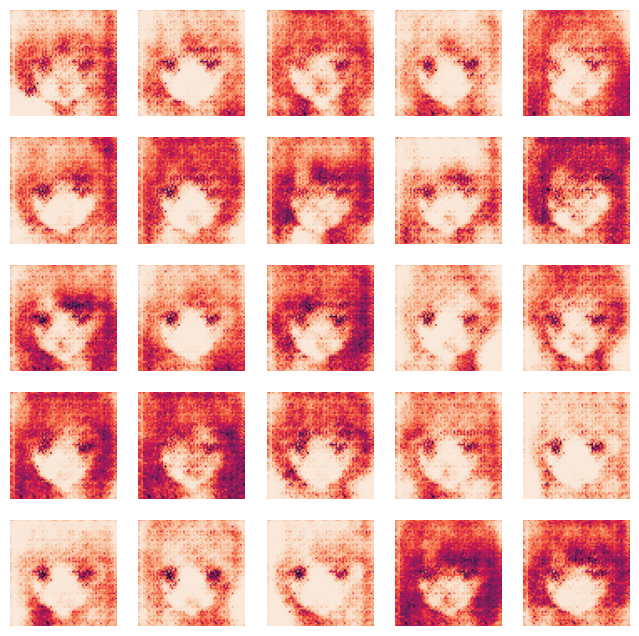

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 171s 86ms/step - d_loss: 0.0689 - g_loss: 0.7270
Epoch 3/100
1987/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.8161 - g_loss: 0.7743

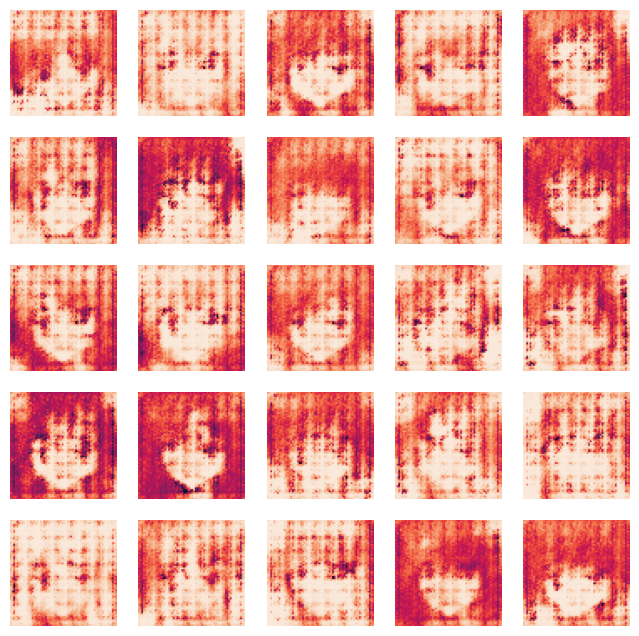

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 201s 86ms/step - d_loss: 0.8161 - g_loss: 0.7743
Epoch 4/100
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.7737 - g_loss: 0.7351

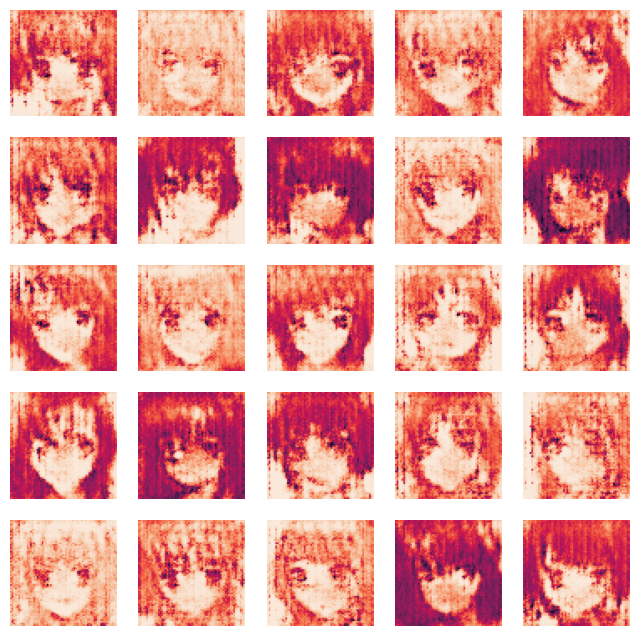

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 170s 86ms/step - d_loss: 0.7737 - g_loss: 0.7351
Epoch 5/100
1987/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.7749 - g_loss: 0.6844

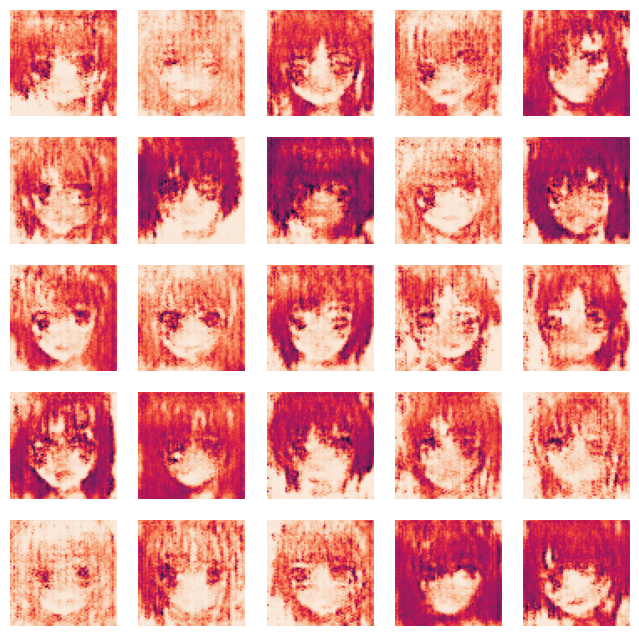

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 202s 86ms/step - d_loss: 0.7749 - g_loss: 0.6844
Epoch 6/100
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.7612 - g_loss: 0.6833

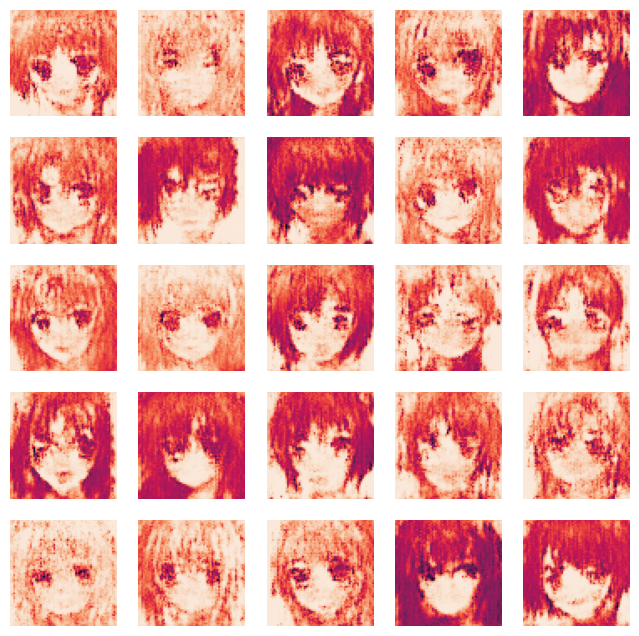

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 202s 86ms/step - d_loss: 0.7612 - g_loss: 0.6833
Epoch 7/100
1987/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.7466 - g_loss: 0.6719

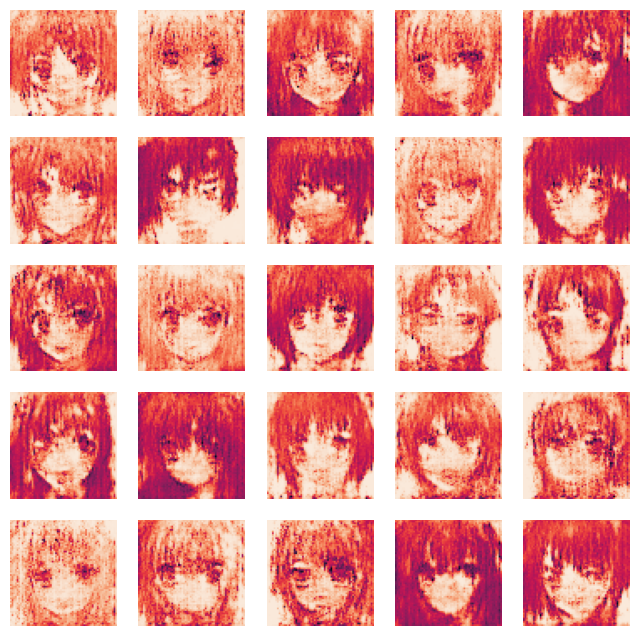

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 202s 85ms/step - d_loss: 0.7466 - g_loss: 0.6719
Epoch 8/100
1987/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.7402 - g_loss: 0.6650

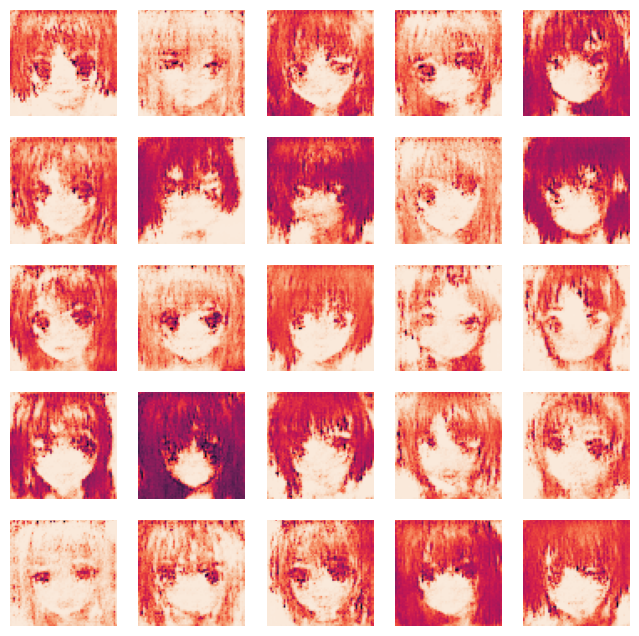

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 169s 85ms/step - d_loss: 0.7402 - g_loss: 0.6650
Epoch 9/100
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.7268 - g_loss: 0.6345

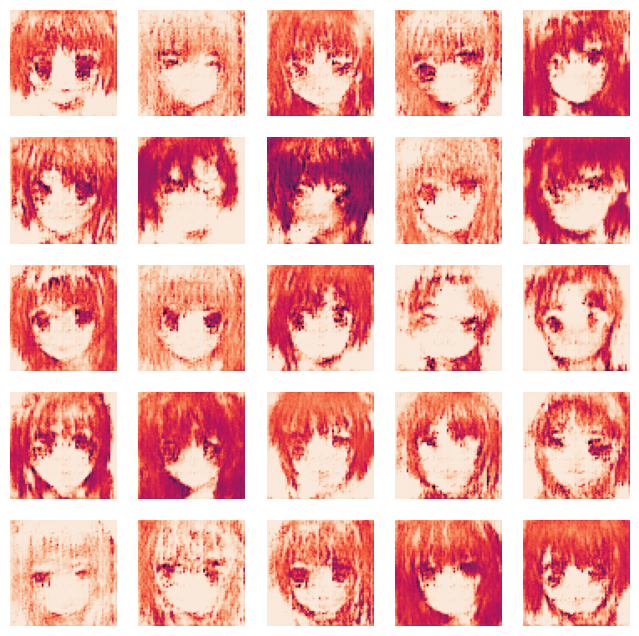

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 203s 86ms/step - d_loss: 0.7268 - g_loss: 0.6345
Epoch 10/100
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.7220 - g_loss: 0.6289

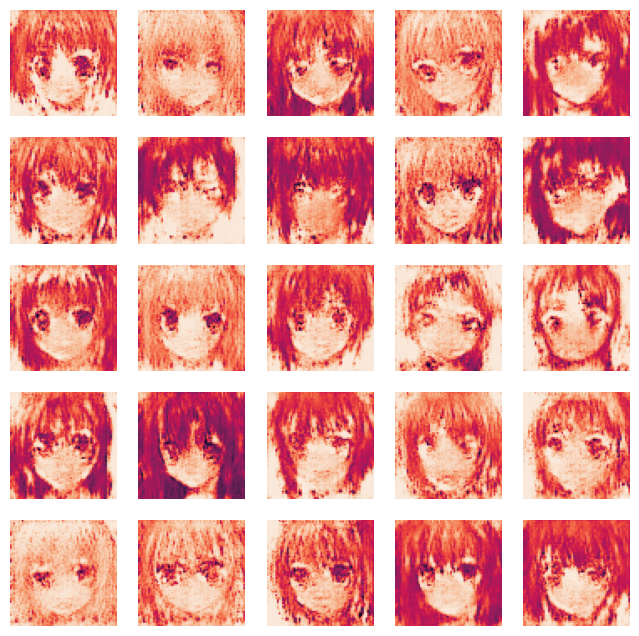

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 201s 86ms/step - d_loss: 0.7220 - g_loss: 0.6289
Epoch 11/100
1987/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.7220 - g_loss: 0.6332

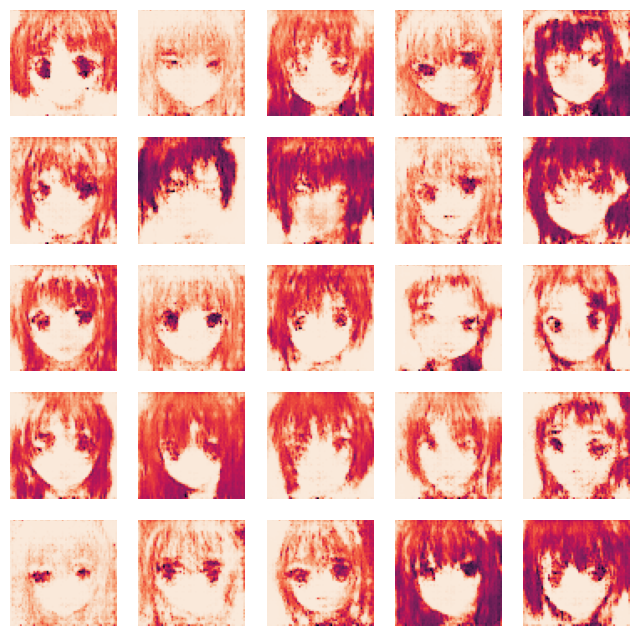

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 202s 86ms/step - d_loss: 0.7220 - g_loss: 0.6332
Epoch 12/100
1987/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.7018 - g_loss: 0.5707

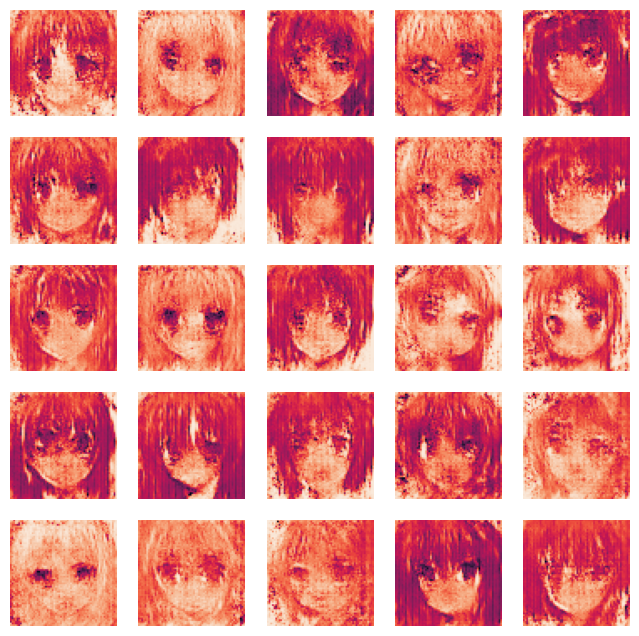

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 202s 86ms/step - d_loss: 0.7018 - g_loss: 0.5707
Epoch 13/100
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.6768 - g_loss: 0.4671

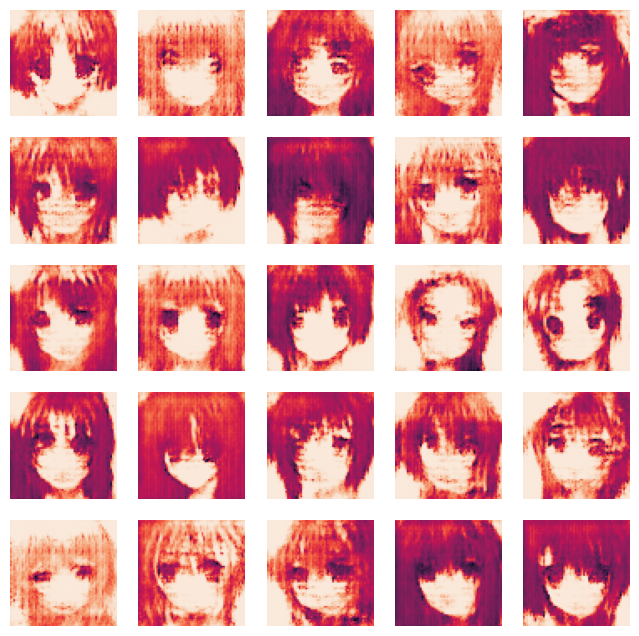

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 201s 85ms/step - d_loss: 0.6767 - g_loss: 0.4671
Epoch 14/100
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.6594 - g_loss: 0.4414

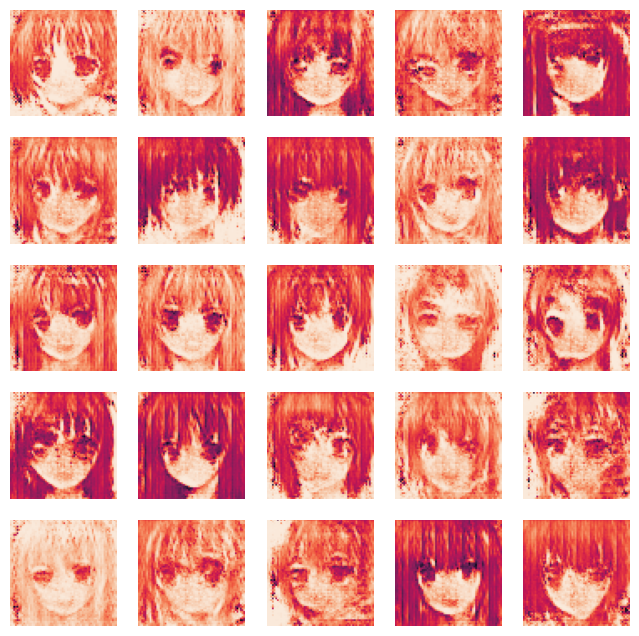

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 170s 86ms/step - d_loss: 0.6594 - g_loss: 0.4414
Epoch 15/100
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.6864 - g_loss: 0.5043

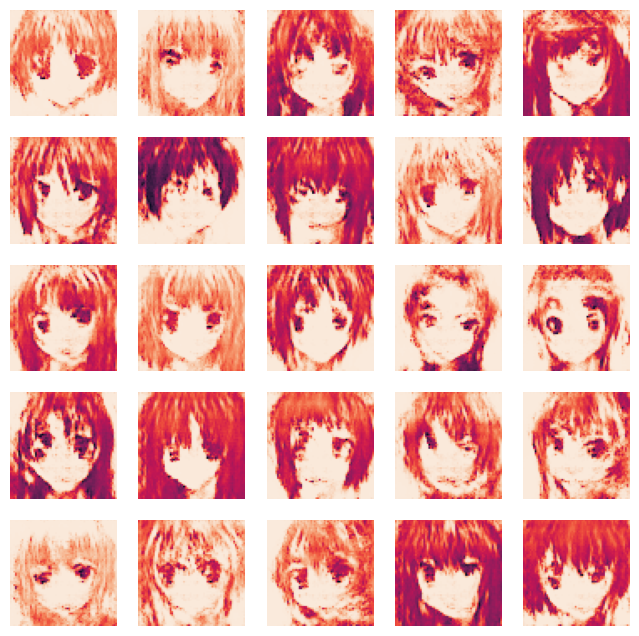

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 202s 85ms/step - d_loss: 0.6864 - g_loss: 0.5042
Epoch 16/100
1987/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - d_loss: 0.5640 - g_loss: 0.3035

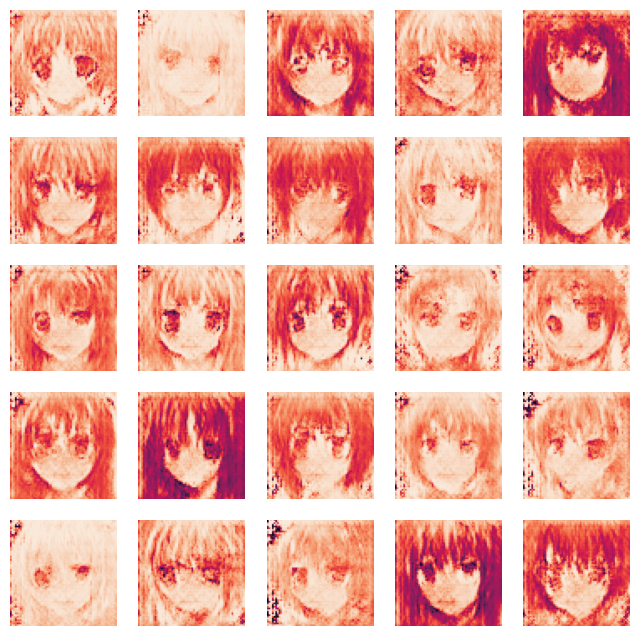

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 202s 85ms/step - d_loss: 0.5640 - g_loss: 0.3034
Epoch 17/100
1476/1987 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - d_loss: 0.4824 - g_loss: 0.2287

In [ ]:
N_EPOCHS = 100
wgan.fit(train_images, epochs=N_EPOCHS, callbacks=[WGANMonitor()])

In [ ]:
wgan.on_train_end()

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Tải mô hình
model_path = '/content/generator.h5'
model = tf.keras.models.load_model(model_path)

# Sinh vector ngẫu nhiên (noise) làm đầu vào
noise = np.random.normal(0, 1, (1, 100))  # Giả sử input có 100 chiều

# Sinh ảnh
generated_image = model.predict(noise)

# Chuẩn hóa ảnh (nếu cần)
generated_image = (generated_image * 255).astype(np.uint8)  # Chuyển sang 0-255

# Làm mượt ảnh với Gaussian Blur
generated_image = cv2.GaussianBlur(generated_image, (5, 5), 0)

# Hiển thị ảnh
plt.imshow(generated_image)
plt.axis('off')
plt.show()
